In [ ]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np

Obróbka danych

In [ ]:
file_path = '/content/drive/MyDrive/Colab Notebooks/Praca inżynierska/Parkinsson disease.csv'
df = pd.read_csv(file_path)
df.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


**name** - ASCII nazwa osoby oraz numer nagrania

**MDVP:Fo(Hz)** - Średnia częstotliwość podstawowa głosu

**MDVP:Fhi(Hz)** - Maksymalna częstotliwość podstawowa głosu

**MDVP:Flo(Hz)** - Minimalna częstotliwość podstawowa głosu

**MDVP(%), MDVP(Abs), MDV, MDVP, Jitter**
- Kilka miar zmienności częstotliwości podstawowej

**MDVP:Shimmer, MDVP:Shimmer(dB), Shimmer:APQ3, Shimmer:APQ5, MDVP:APQ Shimmer:DDA**
- Kilka miar zmienności amplitudy

**NHR, HNR** - Dwie miary stosunku szumów do komponentów tonalnych w głosie

**status** - Stan zdrowia osoby (jeden) - Parkinson, (zero) - zdrowy

**RPDE, D2** - Dwie nieliniowe miary złożoności dynamicznej

**DFA** - Wykładnik skalowania fraktalnego sygnału

**spread1, spread2, PPE** - Trzy nieliniowe miary zmienności częstotliwości podstawowej

In [ ]:
df.shape

(195, 24)

In [ ]:
df.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [ ]:
df['status'].value_counts()

,count
status,
1,147
0,48


In [ ]:
X = df.drop(['name','status'], axis=1)

In [ ]:
X.shape

(195, 22)

In [ ]:
X

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.02971,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.04368,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.03590,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.03772,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.04465,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,0.405,...,0.02745,0.07008,0.02764,19.517,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,0.263,...,0.01879,0.04812,0.01810,19.147,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,0.256,...,0.01667,0.03804,0.10715,17.883,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,0.241,...,0.01588,0.03794,0.07223,19.020,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


In [ ]:
y = df['status']

In [ ]:
y.shape

(195,)

In [ ]:
y # 0 - zdrowy, 1 - Parkinson

,status
0,1
1,1
2,1
3,1
4,1
...,...
190,0
191,0
192,0
193,0


In [ ]:
df.isna().sum() # brakujące dane - is nan i suma dla kazdej ile brakujacych jest

,0
name,0
MDVP:Fo(Hz),0
MDVP:Fhi(Hz),0
MDVP:Flo(Hz),0
MDVP:Jitter(%),0
MDVP:Jitter(Abs),0
MDVP:RAP,0
MDVP:PPQ,0
Jitter:DDP,0
MDVP:Shimmer,0


In [ ]:
df.describe() # statystyka opisowa

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [ ]:
df.corr(numeric_only=True) # najsłabsza korelaca jest wtedy kiedy wynik najblizszy zeru

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
MDVP:Fo(Hz),1.000000,0.400985,0.596546,-0.118003,-0.382027,-0.076194,-0.112165,-0.076213,-0.098374,-0.073742,...,-0.094732,-0.021981,0.059144,-0.383535,-0.383894,-0.446013,-0.413738,-0.249450,0.177980,-0.372356
MDVP:Fhi(Hz),0.400985,1.000000,0.084951,0.102086,-0.029198,0.097177,0.091126,0.097150,0.002281,0.043465,...,-0.003733,0.163766,-0.024893,-0.166136,-0.112404,-0.343097,-0.076658,-0.002954,0.176323,-0.069543
MDVP:Flo(Hz),0.596546,0.084951,1.000000,-0.139919,-0.277815,-0.100519,-0.095828,-0.100488,-0.144543,-0.119089,...,-0.150737,-0.108670,0.210851,-0.380200,-0.400143,-0.050406,-0.394857,-0.243829,-0.100629,-0.340071
MDVP:Jitter(%),-0.118003,0.102086,-0.139919,1.000000,0.935714,0.990276,0.974256,0.990276,0.769063,0.804289,...,0.746635,0.906959,-0.728165,0.278220,0.360673,0.098572,0.693577,0.385123,0.433434,0.721543
MDVP:Jitter(Abs),-0.382027,-0.029198,-0.277815,0.935714,1.000000,0.922911,0.897778,0.922913,0.703322,0.716601,...,0.697170,0.834972,-0.656810,0.338653,0.441839,0.175036,0.735779,0.388543,0.310694,0.748162
MDVP:RAP,-0.076194,0.097177,-0.100519,0.990276,0.922911,1.000000,0.957317,1.000000,0.759581,0.790652,...,0.744919,0.919521,-0.721543,0.266668,0.342140,0.064083,0.648328,0.324407,0.426605,0.670999
MDVP:PPQ,-0.112165,0.091126,-0.095828,0.974256,0.897778,0.957317,1.000000,0.957319,0.797826,0.839239,...,0.763592,0.844604,-0.731510,0.288698,0.333274,0.196301,0.716489,0.407605,0.412524,0.769647
Jitter:DDP,-0.076213,0.097150,-0.100488,0.990276,0.922913,1.000000,0.957319,1.000000,0.759555,0.790621,...,0.744901,0.919548,-0.721494,0.266646,0.342079,0.064026,0.648328,0.324377,0.426556,0.671005
MDVP:Shimmer,-0.098374,0.002281,-0.144543,0.769063,0.703322,0.759581,0.797826,0.759555,1.000000,0.987258,...,0.987626,0.722194,-0.835271,0.367430,0.447424,0.159954,0.654734,0.452025,0.507088,0.693771
MDVP:Shimmer(dB),-0.073742,0.043465,-0.119089,0.804289,0.716601,0.790652,0.839239,0.790621,0.987258,1.000000,...,0.963202,0.744477,-0.827805,0.350697,0.410684,0.165157,0.652547,0.454314,0.512233,0.695058


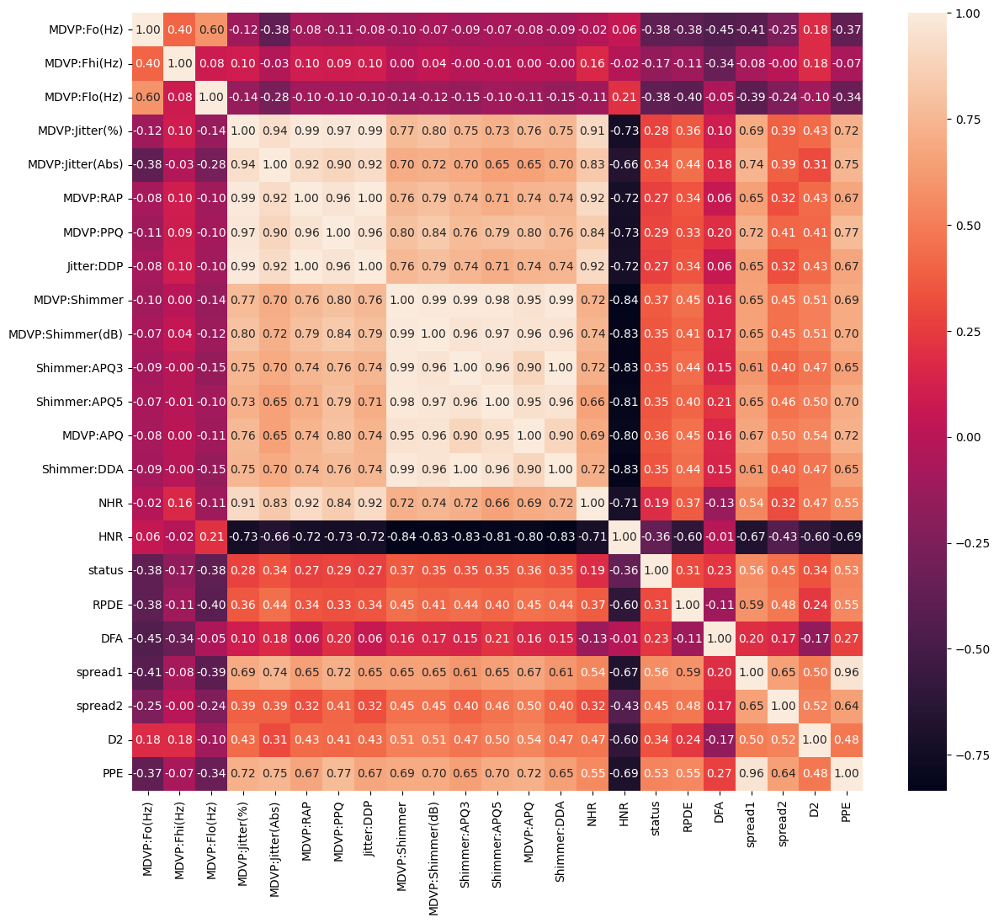

In [ ]:
plt.figure(figsize=(14, 12))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt=".2f") # korelacja - mapa cieplna
plt.show()

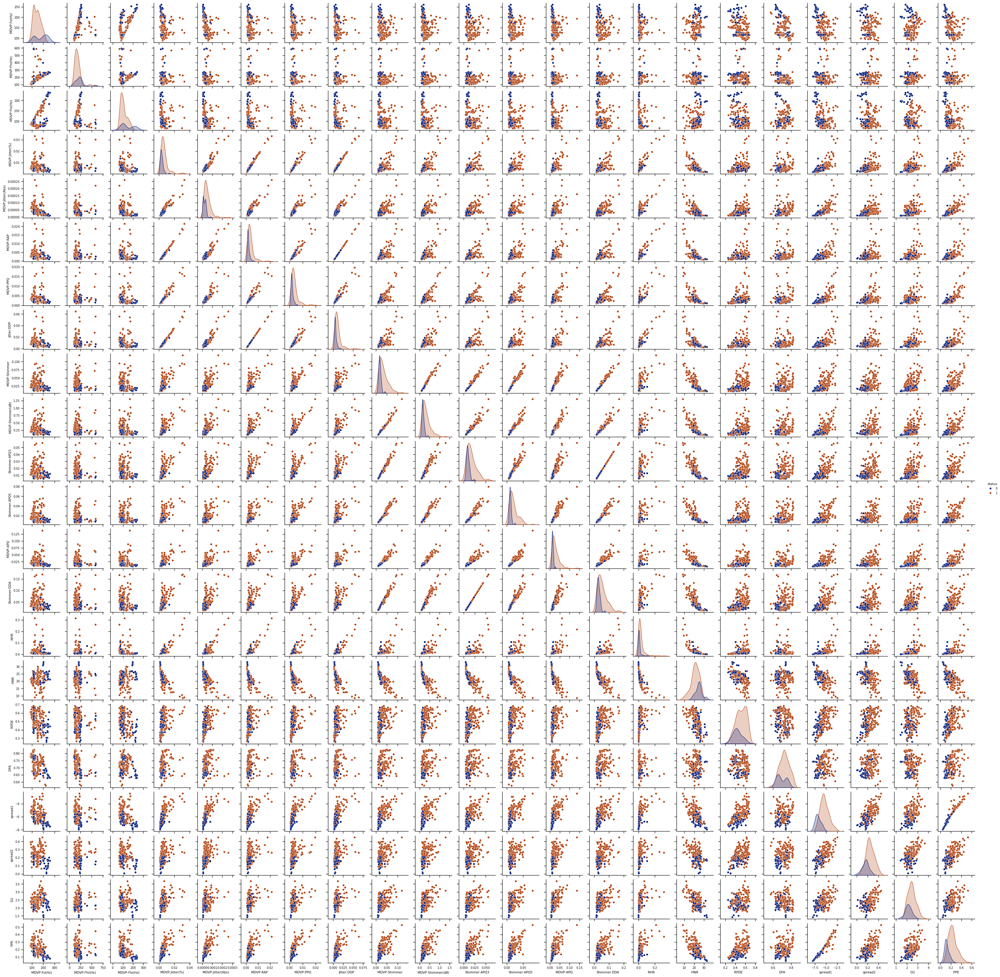

In [ ]:
#wykres macierzowy
sns.pairplot(df,vars=X, hue='status', palette='dark', diag_kind='kde', height=1.5)
# height to wysokosc i dostosowywujemy zeby dobrze bylo widac
# df - przekazujemy caly zbior, vars - ktore dane bierzemy pod uwage, hue - wedlug jakiej kolumny ma kolorwac
# palette - kolor, diag_kind - jaki typ wykresu bedzie na przekatnej
plt.show()

In [ ]:
PPE = df['PPE']
spread1 = df['spread1']
MDVPFlo = df['MDVP:Flo(Hz)']
MDVPFo = df['MDVP:Fo(Hz)']
status = df['status']
df_different=pd.concat([PPE,spread1,MDVPFlo,MDVPFo,status],axis=1)
X_diff = df_different.drop(['status'], axis=1)

In [ ]:
df_different

,PPE,spread1,MDVP:Flo(Hz),MDVP:Fo(Hz),status
0,0.284654,-4.813031,74.997,119.992,1
1,0.368674,-4.075192,113.819,122.400,1
2,0.332634,-4.443179,111.555,116.682,1
3,0.368975,-4.117501,111.366,116.676,1
4,0.410335,-3.747787,110.655,116.014,1
...,...,...,...,...,...
190,0.133050,-6.538586,94.261,174.188,0
191,0.168895,-6.195325,89.488,209.516,0
192,0.131728,-6.787197,74.287,174.688,0
193,0.123306,-6.744577,74.904,198.764,0


In [ ]:
X_diff

,PPE,spread1,MDVP:Flo(Hz),MDVP:Fo(Hz)
0,0.284654,-4.813031,74.997,119.992
1,0.368674,-4.075192,113.819,122.400
2,0.332634,-4.443179,111.555,116.682
3,0.368975,-4.117501,111.366,116.676
4,0.410335,-3.747787,110.655,116.014
...,...,...,...,...
190,0.133050,-6.538586,94.261,174.188
191,0.168895,-6.195325,89.488,209.516
192,0.131728,-6.787197,74.287,174.688
193,0.123306,-6.744577,74.904,198.764


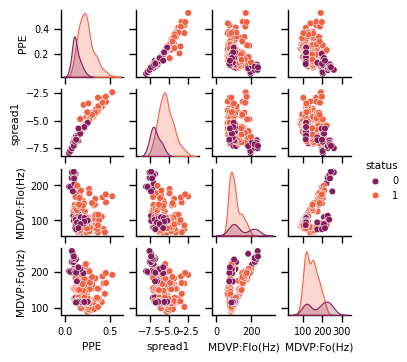

In [ ]:
#wykres macierzowy
sns.set_context("paper", font_scale=0.8)
wm = sns.pairplot(df_different,vars=X_diff, hue='status', palette='rocket', diag_kind='kde', height=0.9, aspect=1.0)
#wm.fig.suptitle("Wykres macierzowy danych niezbalansowanych różnicujących zbiór", y=1.03)
plt.show()

In [ ]:
# SMOTE
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled,y_resampled = smote.fit_resample(X,y)
print("Rozmiar przed nadprobkowaniem",X.shape)
print("Rozmiar po nadpróbkowaniu",X_resampled.shape)
df1=pd.concat([X_resampled,y_resampled],axis=1) # sklejanie nowych danych
df1.shape

Rozmiar przed nadprobkowaniem (195, 22)
Rozmiar po nadpróbkowaniu (294, 22)


(294, 23)

In [ ]:
df1.columns

Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'spread1',
       'spread2', 'D2', 'PPE', 'status'],
      dtype='object')

In [ ]:
df1.columns

Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'spread1',
       'spread2', 'D2', 'PPE', 'status'],
      dtype='object')

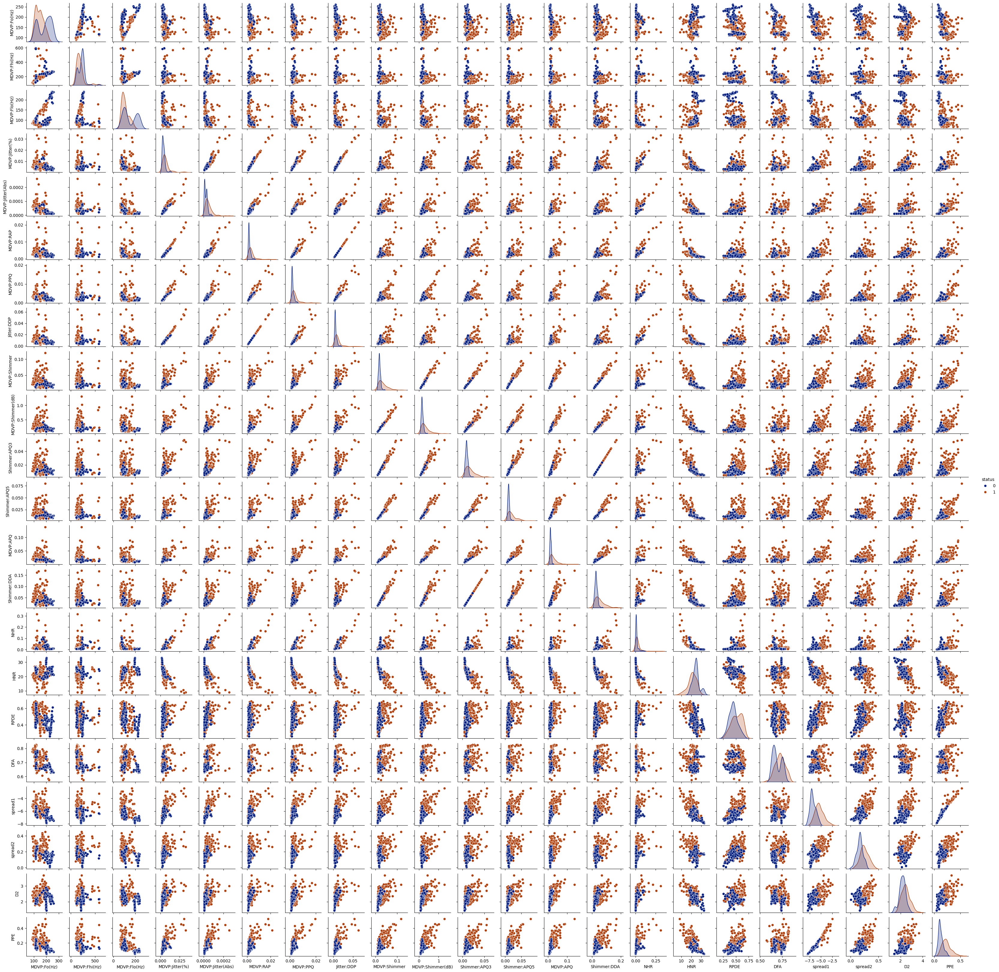

In [ ]:
#wykres macierzowy zbalansowanych danych
sns.pairplot(df1,vars=X_resampled, hue='status', palette='dark', diag_kind='kde', height=1.5)
plt.show()

In [ ]:
PPE1 = df1['PPE']
spread11 = df1['spread1']
MDVPFlo1 = df1['MDVP:Flo(Hz)']
MDVPFo1 = df1['MDVP:Fo(Hz)']
status1 = df1['status']
df1_different=pd.concat([PPE1,spread11,MDVPFlo1,MDVPFo1,status1],axis=1)
X_diff1 = df1_different.drop(['status'], axis=1)

In [ ]:
df1_different

,PPE,spread1,MDVP:Flo(Hz),MDVP:Fo(Hz),status
0,0.284654,-4.813031,74.997000,119.992000,1
1,0.368674,-4.075192,113.819000,122.400000,1
2,0.332634,-4.443179,111.555000,116.682000,1
3,0.368975,-4.117501,111.366000,116.676000,1
4,0.410335,-3.747787,110.655000,116.014000,1
...,...,...,...,...,...
289,0.091653,-7.070877,232.063941,243.119163,0
290,0.163543,-6.157144,94.052415,113.951292,0
291,0.124734,-6.709208,76.678321,191.203091,0
292,0.227271,-5.591254,104.078872,119.839649,0


In [ ]:
X_diff1

,PPE,spread1,MDVP:Flo(Hz),MDVP:Fo(Hz)
0,0.284654,-4.813031,74.997000,119.992000
1,0.368674,-4.075192,113.819000,122.400000
2,0.332634,-4.443179,111.555000,116.682000
3,0.368975,-4.117501,111.366000,116.676000
4,0.410335,-3.747787,110.655000,116.014000
...,...,...,...,...
289,0.091653,-7.070877,232.063941,243.119163
290,0.163543,-6.157144,94.052415,113.951292
291,0.124734,-6.709208,76.678321,191.203091
292,0.227271,-5.591254,104.078872,119.839649


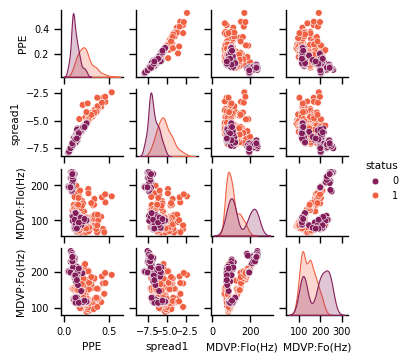

In [ ]:
#wykres macierzowy
sns.set_context("paper", font_scale=0.8)
wm1 = sns.pairplot(df1_different,vars=X_diff1, hue='status', palette='rocket', diag_kind='kde', height=0.9, aspect=1.0)
#wm1.fig.suptitle("Wykres macierzowy danych zbalansowanych różnicujących zbiór", y=1.03)
plt.show()

Rozkłady każdej zmiennej przed zbalansowaniem (po lewej stronie) i po zbalansowaniu (po prawej stronie)

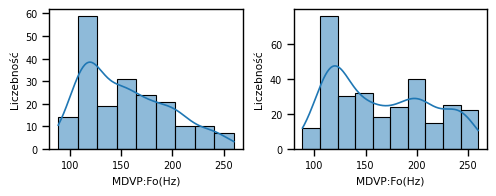

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Fo(Hz)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Fo(Hz)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

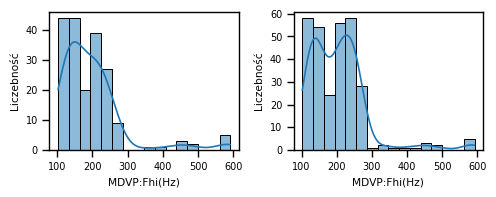

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Fhi(Hz)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Fhi(Hz)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

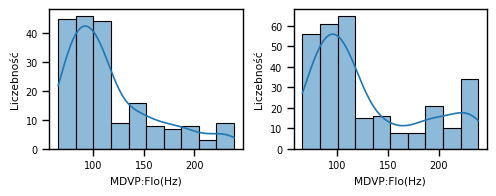

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Flo(Hz)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Flo(Hz)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


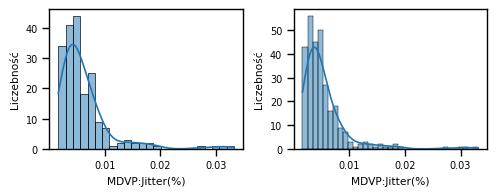

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Jitter(%)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Jitter(%)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


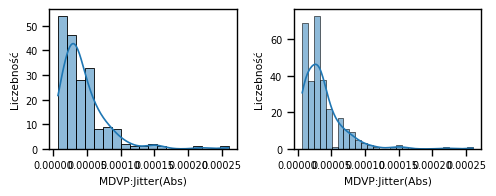

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Jitter(Abs)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Jitter(Abs)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


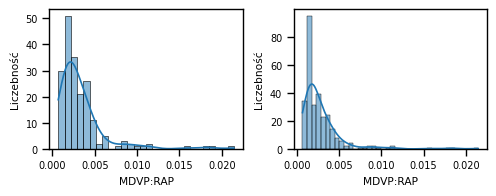

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:RAP'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:RAP'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


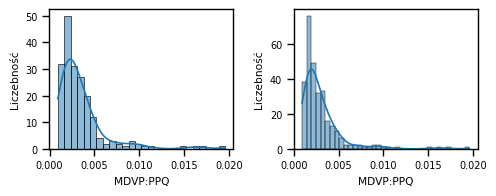

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:PPQ'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:PPQ'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


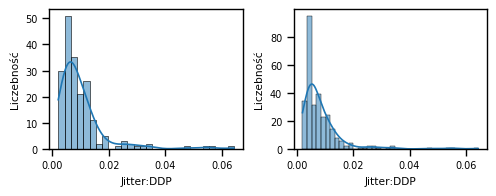

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['Jitter:DDP'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['Jitter:DDP'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


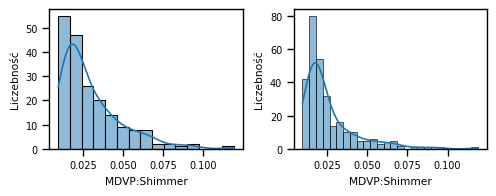

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Shimmer'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Shimmer'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


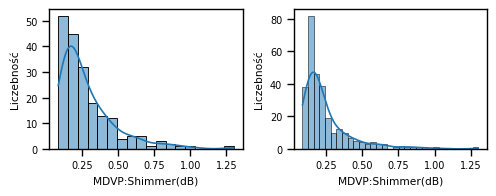

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:Shimmer(dB)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:Shimmer(dB)'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


In [ ]:
pd.set_option('display.max_rows', None)
df['Shimmer:APQ3']

,Shimmer:APQ3
0,0.02182
1,0.03134
2,0.02757
3,0.02924
4,0.03490
5,0.02328
6,0.00779
7,0.00829
8,0.01073
9,0.01441


In [ ]:
pd.set_option('display.max_rows', None)
df1['Shimmer:APQ3']

,Shimmer:APQ3
0,0.021820
1,0.031340
2,0.027570
3,0.029240
4,0.034900
5,0.023280
6,0.007790
7,0.008290
8,0.010730
9,0.014410


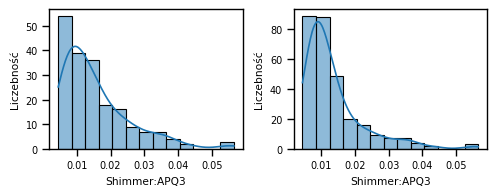

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['Shimmer:APQ3'], kde=True, bins=13)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['Shimmer:APQ3'], kde=True, bins=13)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()


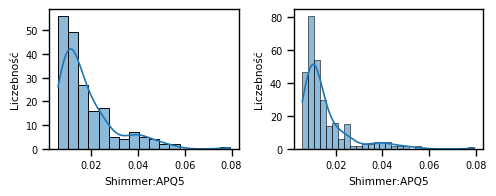

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['Shimmer:APQ5'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['Shimmer:APQ5'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

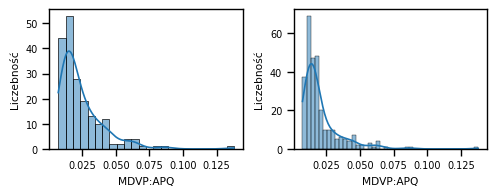

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['MDVP:APQ'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['MDVP:APQ'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

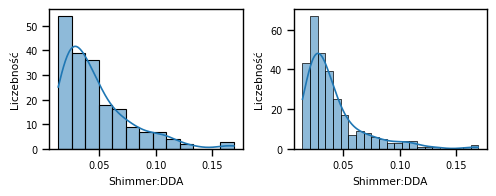

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['Shimmer:DDA'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['Shimmer:DDA'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

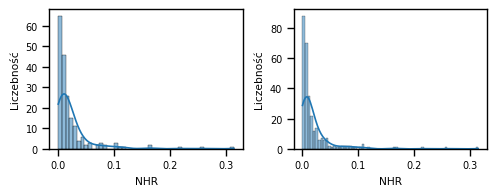

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['NHR'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['NHR'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

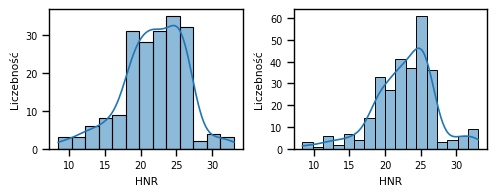

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['HNR'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['HNR'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

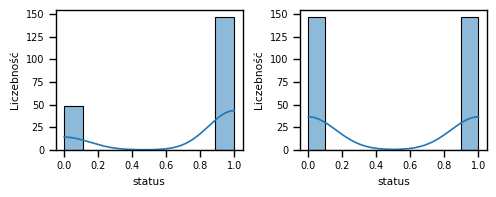

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['status'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['status'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

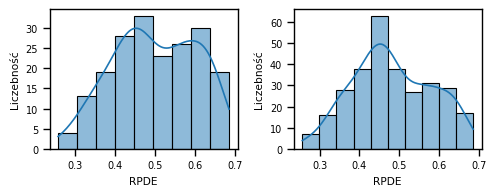

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['RPDE'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['RPDE'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

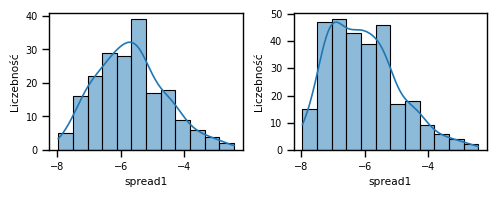

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['spread1'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['spread1'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

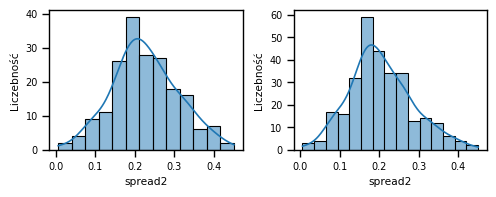

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['spread2'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['spread2'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

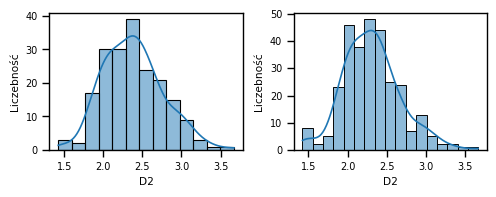

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['D2'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['D2'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

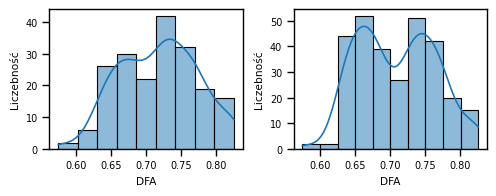

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['DFA'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['DFA'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()

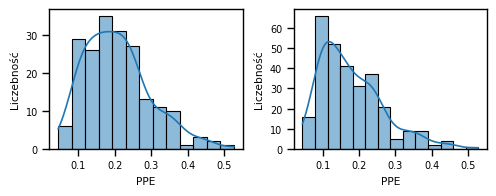

In [ ]:
plt.figure(figsize=(5, 2))

plt.subplot(1, 2, 1)
sns.histplot(df['PPE'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład niezbalansowanej zmiennej')

plt.subplot(1, 2, 2)
sns.histplot(df1['PPE'], kde=True)
plt.ylabel('Liczebność')
#plt.title('Rozkład zbalansowanej zmiennej')

plt.tight_layout()
plt.show()